In [1]:
import importlib
import project_utils.deciles as deciles
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from general_utils import utils
from general_utils.OverallDetailComparisonPlot import OverallDetailComparisonPlot
import general_utils.CorrectedMultivariableTest as CMT
import os

utils.default_plot_format()
utils.pd_display_settings(3)

In [2]:
data_path = r"processed_data\raw_metrics\processed_10min_Nabian.pkl"

pickled = pd.read_pickle(data_path)
data = pickled["data"]
indicator_columns = pickled["indicator_columns"]
time_metrics = pickled["time_metrics"]
frequency_metrics = pickled["frequency_metrics"]
non_linear_metrics = pickled["non_linear_metrics"]
data.tail()

,t_start,t_end,SDRR,RMSSD,pNN50 (%),Mean HR (bpm),ULF Power,ULF Peak Frequency,ULF Peak Power,VLF Power,...,UCr (g),UACR (mg÷g),Complications,Nephropathy,Retinopathy and cataract,DPN,Heart Disease,atherosclerosis or stenosis,Carotid Plaque,Condition
3250,22212,22812,30.89,24.63,3.13,79.80,2.35e-08,0,1.61e-05,4.24e-06,...,7.26,2.88,1,1,0,True,0,0,1,DPN
3251,21611,22211,40.47,34.10,13.03,77.50,1.07e-08,0,9.96e-06,2.39e-06,...,7.26,2.88,1,1,0,True,0,0,1,DPN
3252,21010,21610,38.71,41.98,27.34,75.71,1.28e-09,0.00167,1.49e-06,3.11e-06,...,7.26,2.88,1,1,0,True,0,0,1,DPN
3253,34218,34818,88.51,31.71,12.61,79.37,1.33e-08,0.00167,1.59e-05,3.19e-06,...,7.26,2.88,1,1,0,True,0,0,1,DPN
3254,76304,76903,173.75,220.18,22.22,74.74,3.17e-09,0.00167,3.57e-06,1.2e-06,...,10.23,0.43,1,0,0,True,0,0,1,DPN


In [3]:
data.shape[0]/len(data.id.unique())

123.46153846153847

In [4]:
data.drop(columns=["D2"], inplace=True)
indicator_columns.remove("D2")

In [24]:

plt.figure(figsize=(12, 8))
normalized_data = data.copy()
for column in indicator_columns:
    normalized_data[column] = (normalized_data[column] - normalized_data[column].min()) / (normalized_data[column].max() - normalized_data[column].min())

# Melt the data for plotting
melted_data = normalized_data.melt(id_vars=["id"], value_vars=indicator_columns, var_name="metric", value_name="normalized_value")
import plotly.express as px

# Plot using plotly
fig = px.violin(
    melted_data,
    y="metric",
    x="normalized_value",
    color="metric",
    box=True,
    hover_data=["id"]
)

fig.update_layout(
    showlegend=False,
    xaxis_title_font=dict(size=18),
    yaxis_title_font=dict(size=18),
    xaxis=dict(tickfont=dict(size=14)),
    yaxis=dict(tickfont=dict(size=14)),
    legend_title=dict(text="Metric"),
    width=1000,
    height=1200,
)

fig.update_layout(
    title={
        "text": "<b>Normalized HRV Metric Distributions</b>",
        "x": 0.5,
        "xanchor": "center",
        'font': {'size': 24}
    },
    margin=dict(l=0, r=0, t=100, b=0),  # Remove all side margins
)

fig.update_layout(font=dict(color="black"))
fig.update_yaxes(
    tickfont=dict(size=20, family="Arial", color="black"),
    title=None,  # Remove the y-axis label
    ticktext=[f"<b>{label}</b>" for label in fig.layout.yaxis.categoryarray],
    tickvals=fig.layout.yaxis.categoryarray,
    tickangle=0,
    automargin=True
)
fig.update_layout(
    margin=dict(t=80)  # Raise the labels slightly by increasing the top margin
)

fig.update_xaxes(
    title_text="<b>Normalised Metric Value (AU)<b>",
    title_font=dict(size=20, family="Arial", color="black"),
    tickfont=dict(size=20, family="Arial", color="black")
)

fig.update_traces(side='positive', spanmode='hard', width =2)

fig.show()

<Figure size 1200x800 with 0 Axes>

C:\Users\326po\AppData\Local\Temp\ipykernel_20228\2706487773.py:7: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




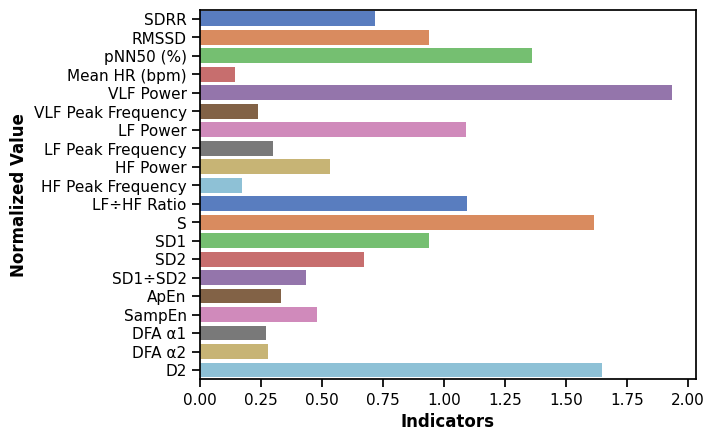

In [ ]:
normalized_data = data.copy()
for column in indicator_columns:
    normalized_data[column] = abs(normalized_data[column].std()/normalized_data[column].mean())

normalized_data = normalized_data.melt(id_vars=["id"], value_vars=indicator_columns, var_name="metric", value_name="value")

sns.barplot(data=normalized_data, y="metric", x="value", hue="metric", ci=None, palette="muted")
plt.ylabel("Normalized Value")
plt.xlabel("Indicators")
plt.show()

# Deciles approach
Goal: Confirm that the statistical significance gotten from whole dataset median is not just a lucky shot in the dark.

We first assign appropriate decile value for each metric by patient

In [ ]:
for column in indicator_columns:  
    data = deciles.make_decile_column(data, column)
data.tail(3)

,t_start,t_end,SDRR,RMSSD,pNN50 (%),Mean HR (bpm),ULF Power,ULF Peak Frequency,ULF Peak Power,VLF Power,...,LF÷HF Ratio_decile,S_decile,SD1_decile,SD2_decile,SD1÷SD2_decile,ApEn_decile,SampEn_decile,DFA α1_decile,DFA α2_decile,D2_decile
3252,21010,21610,38.71,41.98,27.34,75.71,1.28e-09,0.00167,1.49e-06,3.11e-06,...,0,4,5,2,7,8,9,2,2,NaN
3253,34218,34818,88.51,31.71,12.61,79.37,1.33e-08,0.00167,1.59e-05,3.19e-06,...,5,6,4,6,0,3,3,6,7,6
3254,76304,76903,173.75,220.18,22.22,74.74,3.17e-09,0.00167,3.57e-06,1.2e-06,...,0,9,9,9,8,0,0,2,7,9


In [ ]:
data.sort_values(by=['DPN', 'id'], inplace=True)
deciles.draw_by_decile(data, "Mean HR (bpm)")

In [ ]:
importlib.reload(deciles)


<module 'project_utils.deciles' from 'c:\\GITHUB\\HRV-EDA\\project_utils\\deciles.py'>

## Channel identification

most promising channels identified using the permutation test.

In [ ]:
channel_test = pd.DataFrame()
channels = pd.DataFrame()

def statistic(x, y, axis):
    return np.mean(x, axis=axis) - np.mean(y, axis=axis)

for column in indicator_columns:
    agg_decile = deciles.agg_metric_deciles(data, column)
    agg_decile['metric'] = column
    channels = pd.concat([channels, agg_decile])

    test = CMT.CorrectedMultivariableTest(
        data=agg_decile,
        group_col="decile",
        value_col="value",
        cat_col="DPN",
        cat_val_1=False,
        cat_val_2=True,
    )

    t_result = test.permutation_test(statistic, n_permutations=1000)
    #t_result = test.perform_ManWhitney_U_tests()

    t_result.reset_index(drop=False, inplace=True)
    t_result.insert(0, "metric", column)

    channel_test = pd.concat([channel_test, t_result])
channel_test = channel_test.reset_index(drop=True)
channel_test.tail(3)

NameError: name 'np' is not defined

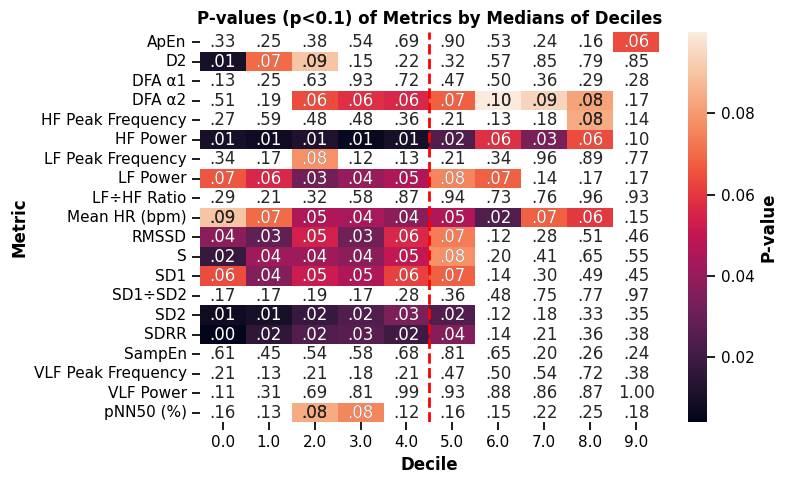

In [ ]:
import numpy as np
from matplotlib.colors import ListedColormap

deciles.plot_p_value_heatmap(channel_test, figsize =(8, 5))

In [ ]:
man_whitney_channels = {
    "HF Power": list(range(7)),
    "LF Power": list(range(3, 7)),
    "Mean HR (bpm)": list(range(2, 8)),
    "RMSSD": list(range(2, 5)),
    "S": list(range(2, 5)),
    "SD1": list(range(2, 5)),
    "SD2": list(range(5)),
    "SDRR": list(range(5)),
}

man_whitney_channels

{'HF Power': [0, 1, 2, 3, 4, 5, 6],
 'LF Power': [3, 4, 5, 6],
 'Mean HR (bpm)': [2, 3, 4, 5, 6, 7],
 'RMSSD': [2, 3, 4],
 'S': [2, 3, 4],
 'SD1': [2, 3, 4],
 'SD2': [0, 1, 2, 3, 4],
 'SDRR': [0, 1, 2, 3, 4]}

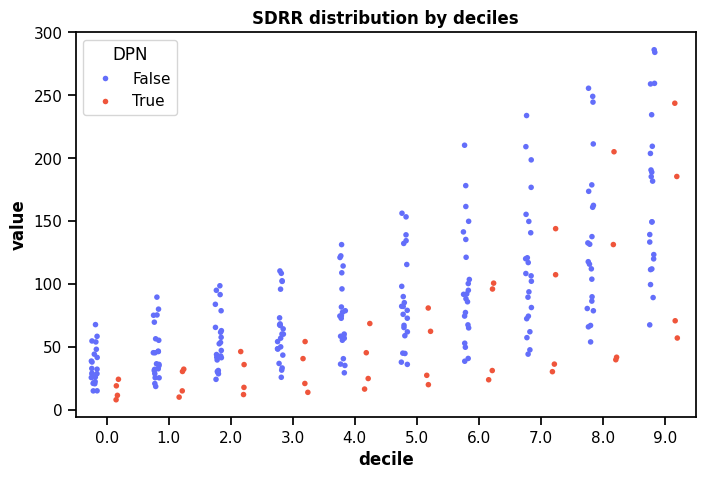

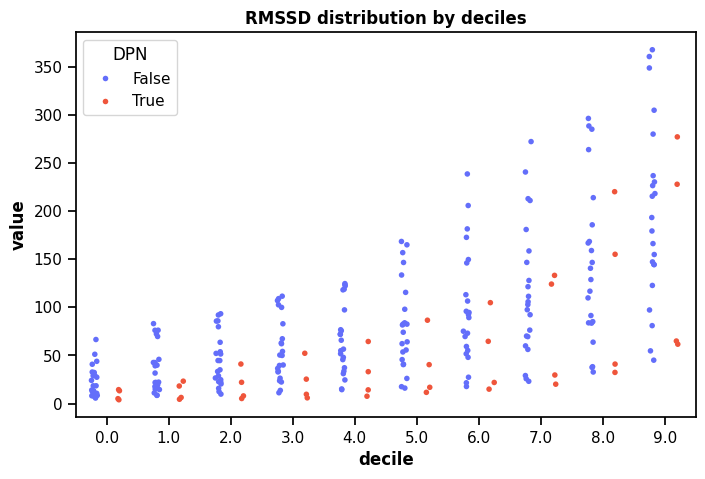

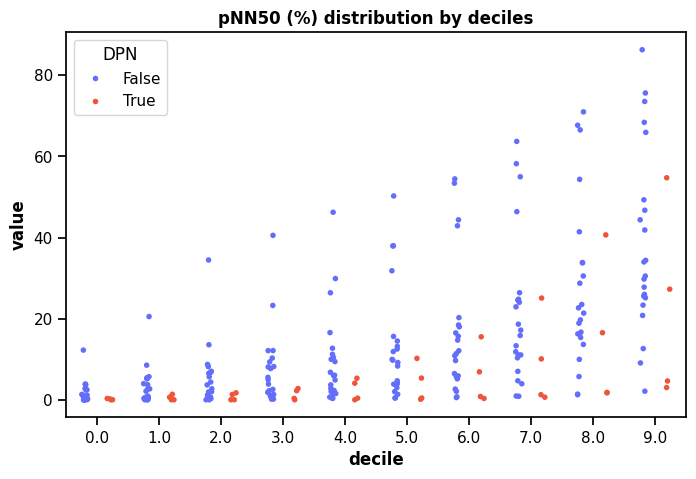

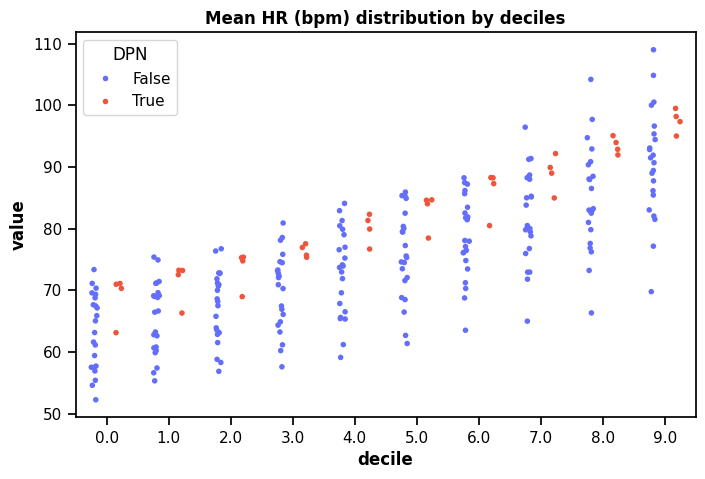

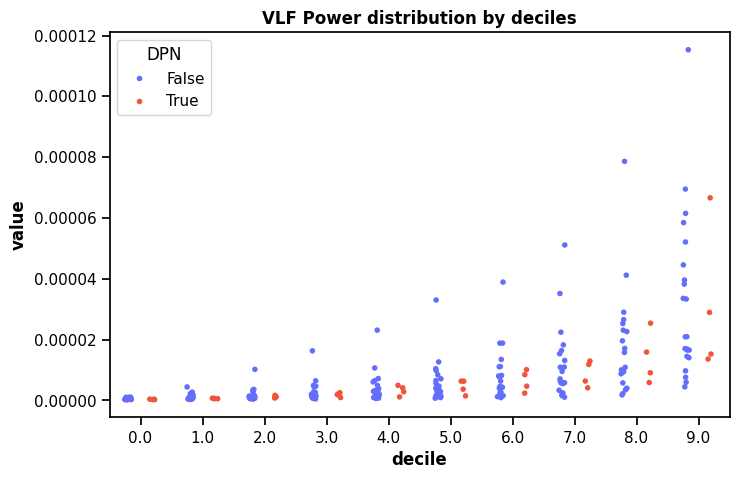

...

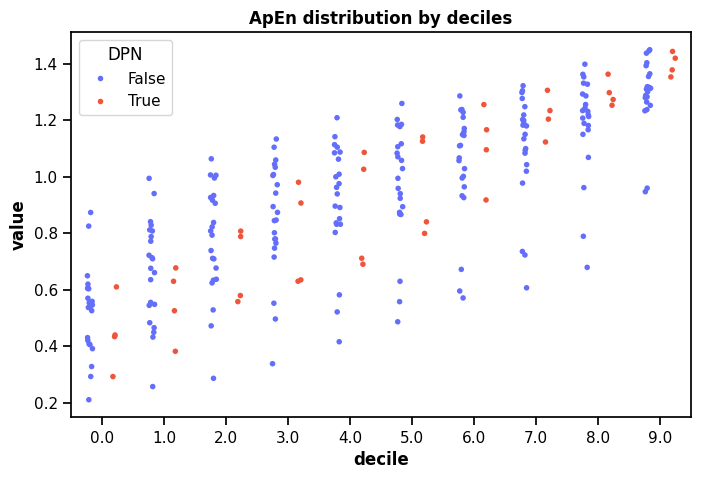

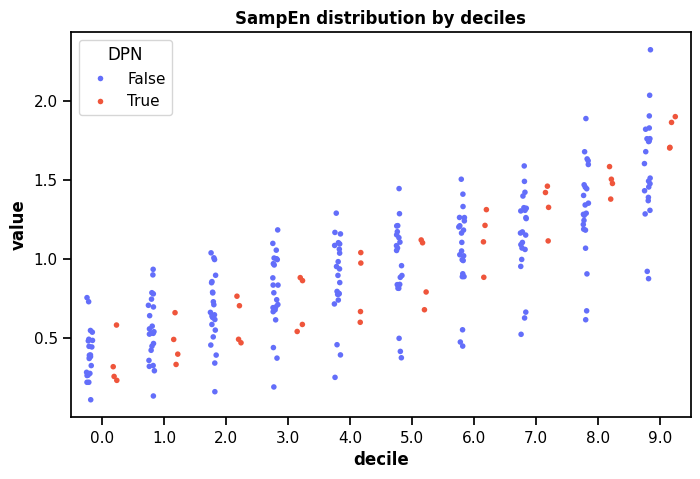

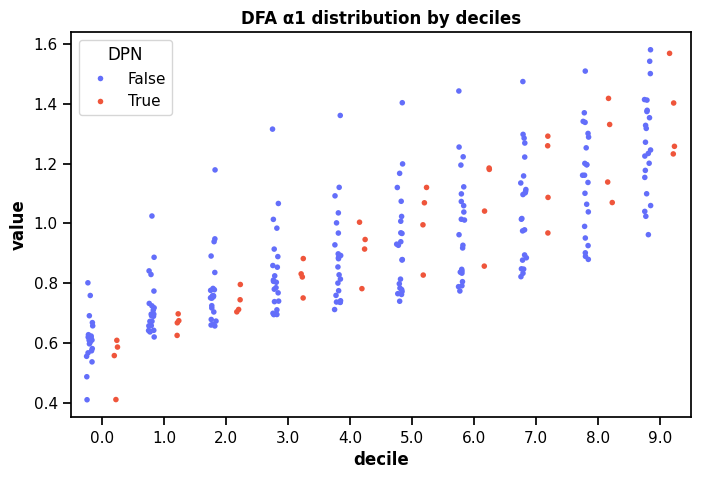

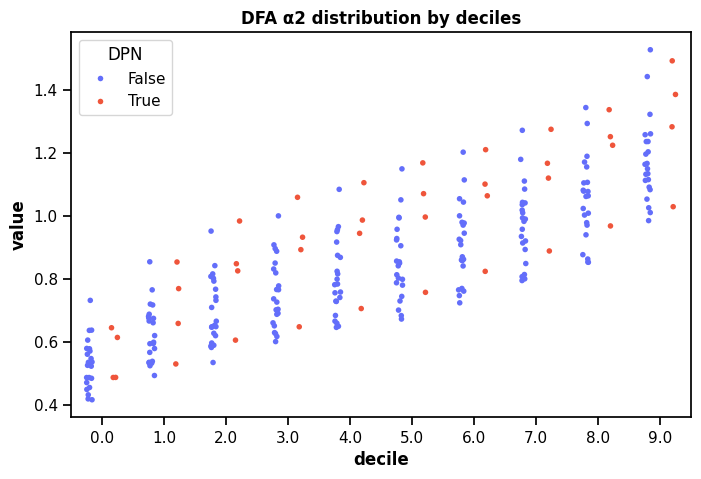

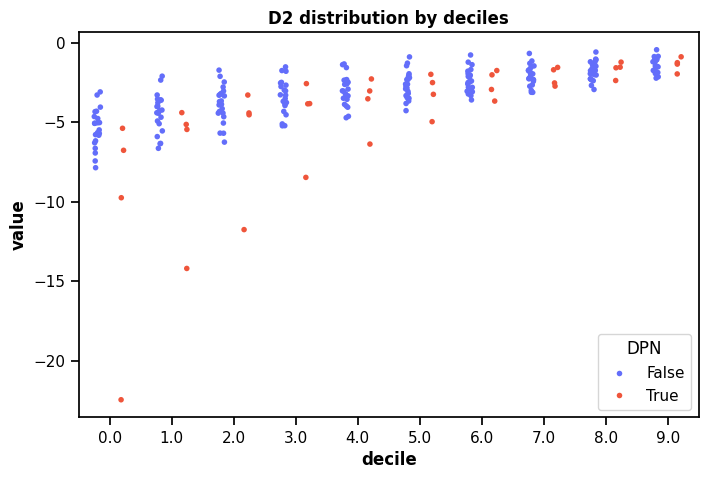

In [ ]:
importlib.reload(deciles)
for metric in indicator_columns:
    deciles.plot_decile_dist(channels, metric, None)

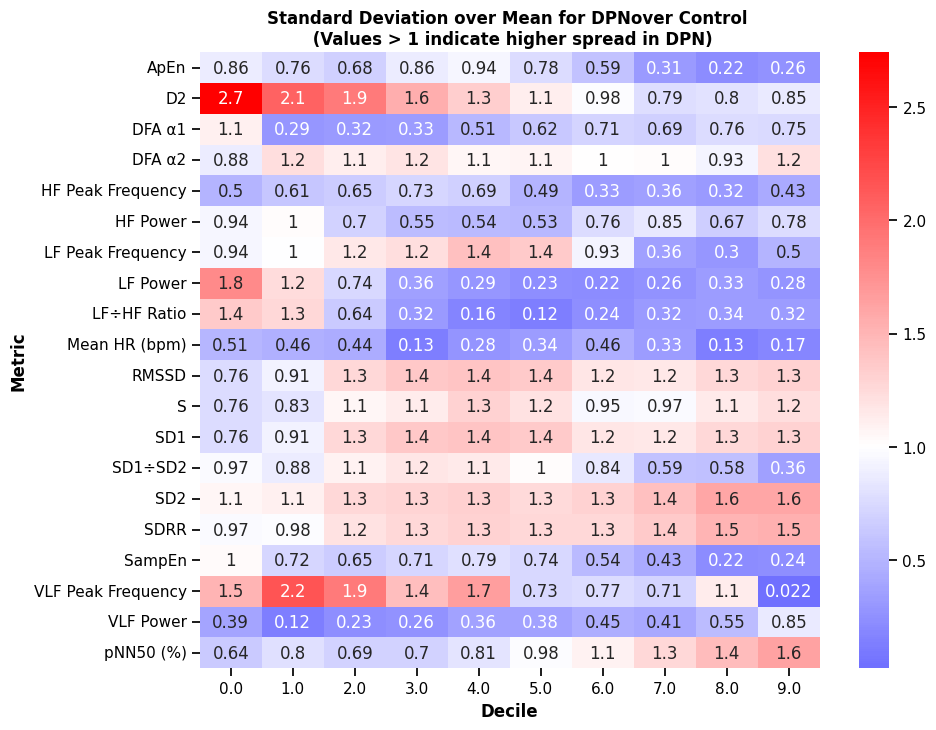

In [ ]:
from matplotlib.colors import LinearSegmentedColormap

def std_over_mean(x):
    return np.std(x) / np.mean(x)

def mad_over_median(x):
    mad = np.median(np.abs(x - np.median(x)))
    return mad / np.median(x)

def calculate_spread_ratio(channels, spread_func):
    channels['spread'] = channels.groupby(['metric', 'decile', 'DPN'])['value'].transform(spread_func)
    decile_spread_ratio = channels.pivot_table(index='metric', columns=['decile', 'DPN'], values='spread')
    decile_spread_ratio = decile_spread_ratio.xs(True, level='DPN', axis=1) / decile_spread_ratio.xs(False, level='DPN', axis=1)
    return decile_spread_ratio

def plot_spread_ratio_heatmap(spread_ratio, title):
    # Create a custom colormap
    colors = [(0, 'blue'), (0.5, 'white'), (1, 'red')]
    cmap = LinearSegmentedColormap.from_list('custom_cmap', colors, N=256)
    
    plt.figure(figsize=(10, 8))
    sns.heatmap(spread_ratio, annot=True, cmap=cmap, center=1)
    plt.title(title)
    plt.xlabel('Decile')
    plt.ylabel('Metric')
    plt.show()



std_over_mean_ratio = calculate_spread_ratio(channels, std_over_mean)
plot_spread_ratio_heatmap(std_over_mean_ratio, "Standard Deviation over Mean for DPNover Control \n (Values > 1 indicate higher spread in DPN)")
# Calculate and display median_over_mad spread ratio


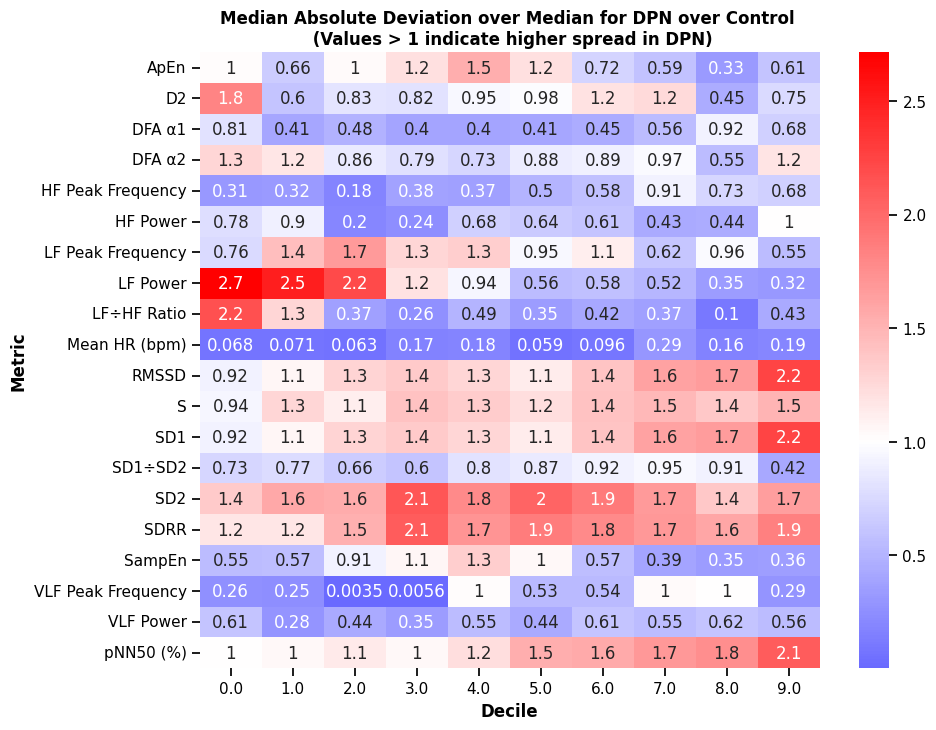

In [ ]:
median_over_mad_ratio = calculate_spread_ratio(channels, mad_over_median)

plot_spread_ratio_heatmap(median_over_mad_ratio, "Median Absolute Deviation over Median for DPN over Control \n (Values > 1 indicate higher spread in DPN)")



In [ ]:
channel_test = channel_test[channel_test.p_value < 0.1].iloc[:,].reset_index(drop=True)

print(
    "Total promissing channels: ",
    channel_test.shape[0],
    "from ",
    len(indicator_columns) * 10,
)
display(channel_test)

Total promissing channels:  66 from  200


,metric,decile,U_statistic,p_value,significant,rank,BH_threshold,BH_Significant
0,SDRR,0,80,0.00709,True,10,0.05,True
1,SDRR,1,76,0.0207,True,9,0.045,True
2,SDRR,2,73,0.0395,True,6,0.03,False
3,SDRR,3,75,0.026,True,8,0.04,True
4,SDRR,4,74,0.0322,True,7,0.035,True
...,...,...,...,...,...,...,...,...
61,ApEn,9,17,0.0577,False,10,0.05,False
62,DFA α2,2,20,0.0959,False,9,0.045,False
63,DFA α2,5,20,0.0959,False,10,0.05,False
64,D2,0,74,0.0322,True,10,0.05,True


# Heart rate as invariant metric.
Since HR is determined by individuals activity and bodily state and HRV is determined on five minute intervals it should be a good metric to compare others against.

First we discard any unrealistic HR values

In [ ]:
data = data[data["Mean HR (bpm)"]>45]

In [ ]:
title = f"HR (bpm) in Diabetic peripheral neuropathy patients"
plotter = OverallDetailComparisonPlot(
    data=data, 
    x_column="id",
    y_column="Mean HR (bpm)",
    hue_column="DPN",
    detail_mode="box",
    points='all',
    title=title)
plotter.show()

There is a lot of variance in heartbeat between each individual.

In [ ]:
display(data)

,t_start,t_end,SDRR,RMSSD,pNN50 (%),Mean HR (bpm),ULF Power,ULF Peak Frequency,ULF Peak Power,VLF Power,...,LF÷HF Ratio_decile,S_decile,SD1_decile,SD2_decile,SD1÷SD2_decile,ApEn_decile,SampEn_decile,DFA α1_decile,DFA α2_decile,D2_decile
0,0.76,600.40,59.95,50.34,4.16,81.75,2.81e-09,0,1.97e-06,2.23e-06,...,9,1,2,2,3,7,7,8,4,NaN
1707,33024,33623,111.81,97.21,20.65,61.55,3.43e-09,0.00167,3.5e-06,4.1e-06,...,2,7,6,8,3,3,4,6,9,7
1708,32423,33023,73.34,107.40,28.18,58.89,4.93e-08,0,4.35e-05,5.37e-07,...,0,4,8,1,9,6,7,0,1,2
1709,31823,32422,123.29,129.77,22.53,60.90,1.5e-08,0.00167,1.78e-05,4.43e-06,...,1,9,9,8,6,1,2,1,7,8
1710,31222,31822,50.69,54.19,20.21,57.46,1.78e-10,0.00167,1.79e-07,5.58e-06,...,1,1,2,0,7,9,9,4,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3249,22812,23412,44.77,26.04,4.24,80.28,3.24e-08,0.00167,3.17e-05,3.82e-06,...,4,3,3,4,2,5,5,5,6,1
3250,22212,22812,30.89,24.63,3.13,79.80,2.35e-08,0,1.61e-05,4.24e-06,...,4,2,3,1,5,9,9,6,5,NaN
3251,21611,22211,40.47,34.10,13.03,77.50,1.07e-08,0,9.96e-06,2.39e-06,...,2,4,4,3,5,9,8,4,7,1
3252,21010,21610,38.71,41.98,27.34,75.71,1.28e-09,0.00167,1.49e-06,3.11e-06,...,0,4,5,2,7,8,9,2,2,NaN


In [ ]:
import general_utils.utils as u


data["Mean HR (bpm)"] = data["Mean HR (bpm)"].astype(float)
decile = data
decile['Decile'] = decile.groupby('id')["Mean HR (bpm)"].transform(lambda x: pd.qcut(x, 10, labels=False))

decile.head()

,t_start,t_end,SDRR,RMSSD,pNN50 (%),Mean HR (bpm),ULF Power,ULF Peak Frequency,ULF Peak Power,VLF Power,...,S_decile,SD1_decile,SD2_decile,SD1÷SD2_decile,ApEn_decile,SampEn_decile,DFA α1_decile,DFA α2_decile,D2_decile,Decile
0,0.76,600.40,59.95,50.34,4.16,81.75,2.81e-09,0,1.97e-06,2.23e-06,...,1,2,2,3,7,7,8,4,NaN,8
1707,33024,33623,111.81,97.21,20.65,61.55,3.43e-09,0.00167,3.5e-06,4.1e-06,...,7,6,8,3,3,4,6,9,7,3
1708,32423,33023,73.34,107.40,28.18,58.89,4.93e-08,0,4.35e-05,5.37e-07,...,4,8,1,9,6,7,0,1,2,2
1709,31823,32422,123.29,129.77,22.53,60.90,1.5e-08,0.00167,1.78e-05,4.43e-06,...,9,9,8,6,1,2,1,7,8,3
1710,31222,31822,50.69,54.19,20.21,57.46,1.78e-10,0.00167,1.79e-07,5.58e-06,...,1,2,0,7,9,9,4,0,0,2


Check whether the decile is correctly calculated

In [ ]:
title = "Deciles of Mean HR (bpm) in PDR patients"
plotter = OverallDetailComparisonPlot(data=decile, 
                    x_column="id",
                    y_column="Mean HR (bpm)",
                    hue_column="Decile",
                    title=title,
                    category_orders={"Decile": [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]},
                    detail_mode="strip")

plotter.setup_general_layout(ratio=1/5)
                    
plotter.show()

In [ ]:
df_decile = decile[~decile.Decile.isin([0, 9])]
df_decile = df_decile[df_decile['SDRR'] <= 1000]
df_decile = df_decile[df_decile['RMSSD'] <= 1000]

Bellow are the results we got without discarding the 0th and 9th decile in Heart rate (BPM)

Now we compar the spread ratios

# Appendix

## Image generator

In [ ]:
import plotly.express as px

median_melted = deciles.produce_median_melt(data, indicator_columns)

def bolden(text):
    return f"<b>{text}</b>"

title = bolden("Median SDRR per Patient (p=0.032; α=0.043)")
fig = px.strip(median_melted[median_melted.metric=='SDRR'], x="DPN", y="value", color="DPN", title=title)
fig.update_traces(marker=dict(size=11, line=dict(width=2, color='black')))
fig.update_traces(jitter=0.8)

fig.for_each_trace(lambda t: t.update(name='Control' if t.name == 'False' else 'DPN'))

axis_font = {'size': 16, 'family': 'Arial', 'color': 'black'}
fig.update_layout(
    title={'text': title, 'x': 0.5, 'xanchor': 'center', 'font': {'size': 20, 'family': 'Arial', 'color': 'black'}},
    xaxis_title={'text': bolden('Condition'), 'font': axis_font},
    yaxis_title={'text': bolden('SDRR (ms)'), 'font': axis_font},
    font=dict(family="Arial", size=16, color="black"),
    width=500, height = 400,
    margin=dict(l=20, r=20, t=70, b=20),
    legend=dict(title='Condition', x=0.99, y=0.99, xanchor='right', yanchor='top'),
    xaxis=dict(
        tickmode='array',
        tickvals=[False, True],
        ticktext=['Control (Diabetes)', 'Diabetic Peripheral Neuropathy']
    )
)

fig.update_layout(showlegend=False)
fig.write_image("high_quality_plot.png", format='png', scale=6)


fig.show()

In [ ]:
title = bolden("SDRR Distribution per Patient for Control and DPN")
data['id'] = data.id.astype(str)

fig = px.box(data, x='id', y="SDRR", color="DPN", title=title)
#fig.update_traces(marker=dict(size=11, line=dict(width=1, color='black')))
fig.update_traces(jitter=0.8)

fig.for_each_trace(lambda t: t.update(name='Control' if t.name == 'False' else 'DPN'))

axis_font = {'size': 16, 'family': 'Arial', 'color': 'black'}
fig.update_layout(
    title={'text': title, 'x': 0.5, 'xanchor': 'center', 'font': {'size': 20, 'family': 'Arial', 'color': 'black'}},
    xaxis_title={'text': bolden('Patient id'), 'font': axis_font},
    yaxis_title={'text': bolden('SDRR (ms)'), 'font': axis_font},
    font=dict(family="Arial", size=16, color="black"),

    width=600, height = 600,

    margin=dict(l=20, r=20, t=40, b=20),
    legend=dict(title='Condition', x=0.99, y=0.99, xanchor='right', yanchor='top'),

)


#fig.update_layout(showlegend=False)
fig.write_image("messy_plot.png", format='png', scale=6)


fig.show()